# Generating CIFAR-10 images with Stable Diffusion

The Stable Diffusion model is a type of denoising model specifically designed to remove noise from images. In this notebook, we will be utilizing this model to generate CIFAR-10 images.

Denoising models are designed to remove noise from images, and in this particular case, we will be using a diffusion-based denoiser to generate images. This type of denoiser is trained by applying a series of noise levels to the image iteratively, and then training the model to remove this noise.

# Installations and Imports

In [1]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [2]:
# Used to create GIF of DDPM training process
!pip3 install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
# Import of libraries
import random
import imageio
import numpy as np
from argparse import ArgumentParser

from tqdm.auto import tqdm
import matplotlib.pyplot as plt

import einops
import torch
import torch.nn as nn
from torch.optim import Adam
from torch.utils.data import DataLoader

from torchvision.transforms import Compose, Resize, Grayscale, ToTensor, Lambda
from torchvision.datasets.cifar import CIFAR10

## Execution options


In [4]:
# Setting reproducibility
SEED = 0 # Set random seed
random.seed(SEED) # Set Python random seed
np.random.seed(SEED) # Set NumPy random seed
torch.manual_seed(SEED) # Set PyTorch random seed

In [5]:
# Setting Execution Options
no_train = False # If True, no training is performed
batch_size = 128 # Batch size
n_epochs = 100 # Number of epochs
lr = 0.001 # Learning rate
store_path = "ddpm_model.pt" # Path to store the model

In [6]:
# Getting device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Printing device
print(f"Using device: {device}\t" + (f"{torch.cuda.get_device_name(0)}" if torch.cuda.is_available() else "CPU"))

Using device: cuda	Tesla V100-SXM2-16GB


# Utility Functions for Visualization

In [7]:
def show_images(images, title=""):
    """Shows the provided images as sub-pictures in a square"""

    # Converting images to CPU numpy arrays
    if type(images) is torch.Tensor:
        images = images.detach().cpu().numpy()

    # Defining number of rows and columns
    fig = plt.figure(figsize=(8, 8))
    rows = int(len(images) ** (1 / 2))
    cols = round(len(images) / rows)

    # Populating figure with sub-plots
    idx = 0
    for r in range(rows):
        for c in range(cols):
            fig.add_subplot(rows, cols, idx + 1)

            if idx < len(images):
                plt.imshow(images[idx][0], cmap="gray")
                idx += 1
    fig.suptitle(title, fontsize=30)

    # Showing the figure
    plt.show()

In [8]:
def generate_new_images(ddpm, n_samples=16, device=None, frames_per_gif=100, gif_name="sampling.gif", c=1, h=28, w=28):
    """Given a DDPM model, a number of samples to be generated and a device, returns some newly generated samples"""
    frame_idxs = np.linspace(0, ddpm.n_steps, frames_per_gif).astype(np.uint)
    frames = []

    with torch.no_grad():
        if device is None:
            device = ddpm.device

        # Starting from random noise
        x = torch.randn(n_samples, c, h, w).to(device)

        for idx, t in enumerate(list(range(ddpm.n_steps))[::-1]):
            # Estimating noise to be removed
            time_tensor = (torch.ones(n_samples, 1) * t).to(device).long()
            eta_theta = ddpm.backward(x, time_tensor)

            alpha_t = ddpm.alphas[t]
            alpha_t_bar = ddpm.alpha_bars[t]

            # Partially denoising the image
            x = (1 / alpha_t.sqrt()) * (x - (1 - alpha_t) / (1 - alpha_t_bar).sqrt() * eta_theta)

            if t > 0:
                z = torch.randn(n_samples, c, h, w).to(device)

                # Option 1: sigma_t squared = beta_t
                beta_t = ddpm.betas[t]
                sigma_t = beta_t.sqrt()

                # Option 2: sigma_t squared = beta_tilda_t
                # prev_alpha_t_bar = ddpm.alpha_bars[t-1] if t > 0 else ddpm.alphas[0]
                # beta_tilda_t = ((1 - prev_alpha_t_bar)/(1 - alpha_t_bar)) * beta_t
                # sigma_t = beta_tilda_t.sqrt()

                # Adding some more noise like in Langevin Dynamics fashion
                x = x + sigma_t * z

            # Adding frames to the GIF
            if idx in frame_idxs or t == 0:
                # Putting digits in range [0, 255]
                normalized = x.clone()
                for i in range(len(normalized)):
                    normalized[i] -= torch.min(normalized[i])
                    normalized[i] *= 255 / torch.max(normalized[i])

                # Reshaping batch (n, c, h, w) to be a (as much as it gets) square frame
                frame = einops.rearrange(normalized, "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=int(n_samples ** 0.5))
                frame = frame.cpu().numpy().astype(np.uint8)

                # Rendering frame
                frames.append(frame)

    # Storing the gif
    with imageio.get_writer(gif_name, mode="I") as writer:
        for idx, frame in enumerate(frames):
            writer.append_data(frame)
            if idx == len(frames) - 1:
                for _ in range(frames_per_gif // 3):
                    writer.append_data(frames[-1])
    return x

## Loading data

In [9]:
# Loading the data (converting each image into a tensor and normalizing between [-1, 1]). This is because the DDPM network predicts normally distributed noises throughout the denoising process.
transform = Compose([
    Grayscale(1),
    Resize((28, 28)),
    ToTensor(),
    Lambda(lambda x: (x - 0.5) * 2)]
)
dataset = CIFAR10("./datasets", download=True, train=True, transform=transform)
loader = DataLoader(dataset, batch_size, shuffle=True)

Files already downloaded and verified


## Building the Model

#### Defining the DDPM module

We now proceed and define a DDPM PyTorch module. Since in principle the DDPM scheme is independent of the model architecture used in each denoising step, we define a high-level model that is constructed using a `network` parameter, as well as:

- `n_steps`: number of diffusion steps $T$;
- `min_beta`: value of the first $\beta_t$ ($\beta_1$);
- `max_beta`: value of the last  $\beta_t$ ($\beta_T$);
- `device`: device onto which the model is run;
- `image_chw`: tuple contining dimensionality of images.

The `forward` process of DDPMs benefits from a nice property: We don't actually need to slowly add noise step-by-step, but we can directly skip to whathever step $t$ we want using coefficients $\alpha_bar$.

For the `backward` method instead, we simply let the network do the job.

Note that in this implementation, $t$ is assumed to be a `(N, 1)` tensor, where `N` is the number of images in tensor `x`. We thus support different time-steps for multiple images.

In [10]:
# DDPM class
class DDPM(nn.Module):
    def __init__(self, network, n_steps=200, min_beta=10 ** -4, max_beta=0.02, device=None, image_chw=(1, 28, 28)):
        super(DDPM, self).__init__()
        self.n_steps = n_steps
        self.device = device
        self.image_chw = image_chw
        self.network = network.to(device)
        self.betas = torch.linspace(min_beta, max_beta, n_steps).to(
            device)  # Number of steps is typically in the order of thousands
        self.alphas = 1 - self.betas
        self.alpha_bars = torch.tensor([torch.prod(self.alphas[:i + 1]) for i in range(len(self.alphas))]).to(device)

    def forward(self, x0, t, eta=None):
        # Make input image more noisy (we can directly skip to the desired step)
        n, c, h, w = x0.shape
        a_bar = self.alpha_bars[t]

        if eta is None:
            eta = torch.randn(n, c, h, w).to(self.device)

        noisy = a_bar.sqrt().reshape(n, 1, 1, 1) * x0 + (1 - a_bar).sqrt().reshape(n, 1, 1, 1) * eta
        return noisy

    def backward(self, x, t):
        # Run each image through the network for each timestep t in the vector t.
        # The network returns its estimation of the noise that was added.
        return self.network(x, t)

#### UNet architecture

Okay great! All that concerns DDPM is down on the table already. So now we simply define an architecture that will be responsible of denoising the we should be good to go... Not so fast! While in principle that's true, we have to be careful to conditioning our model with the temporal information. 

Remember that the only term of the loss function that we really care about is $||\epsilon - \epsilon_\theta(\sqrt{\bar{\alpha}_t}x_0 + \sqrt{1 - \bar{\alpha}_t}\epsilon, t)||^2$, where $\epsilon$ is some random noise and $\epsilon_\theta$ is the model's prediction of the noise. Now, $\epsilon_\theta$ is a function of both $x$ and $t$ and we don't want to have a distinct model for each denoising step (thousands of independent models), but instead we want to use a single model that takes as input the image $x$ and the scalar value indicating the timestep $t$.

To do so, in practice we use a sinusoidal embedding (function `sinusoidal_embedding`) that maps each time-step to a `time_emb_dim` dimension. These time embeddings are further mapped with some time-embedding MLPs (function `_make_te`) and added to tensors through the network in a channel-wise manner.

**NOTE:** This UNet architecture is purely arbitrary and was desined to work with 28x28 spatial resolution images.

In [11]:
def sinusoidal_embedding(n, d):
    # Returns the standard positional embedding
    embedding = torch.zeros(n, d)
    wk = torch.tensor([1 / 10_000 ** (2 * j / d) for j in range(d)])
    wk = wk.reshape((1, d))
    t = torch.arange(n).reshape((n, 1))
    embedding[:,::2] = torch.sin(t * wk[:,::2])
    embedding[:,1::2] = torch.cos(t * wk[:,::2])

    return embedding

In [12]:
class MyBlock(nn.Module):
    def __init__(self, shape, in_c, out_c, kernel_size=3, stride=1, padding=1, activation=None, normalize=True):
        super(MyBlock, self).__init__()
        self.ln = nn.LayerNorm(shape)
        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size, stride, padding)
        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size, stride, padding)
        self.activation = nn.SiLU() if activation is None else activation
        self.normalize = normalize

    def forward(self, x):
        out = self.ln(x) if self.normalize else x
        out = self.conv1(out)
        out = self.activation(out)
        out = self.conv2(out)
        out = self.activation(out)
        return out

In [13]:
class MyUNet(nn.Module):
    def __init__(self, n_steps=1000, time_emb_dim=100):
        super(MyUNet, self).__init__()

        # Sinusoidal embedding
        self.time_embed = nn.Embedding(n_steps, time_emb_dim)
        self.time_embed.weight.data = sinusoidal_embedding(n_steps, time_emb_dim)
        self.time_embed.requires_grad_(False)

        # First half
        self.te1 = self._make_te(time_emb_dim, 1)
        self.b1 = nn.Sequential(
            MyBlock((1, 28, 28), 1, 10),
            MyBlock((10, 28, 28), 10, 10),
            MyBlock((10, 28, 28), 10, 10)
        )
        self.down1 = nn.Conv2d(10, 10, 4, 2, 1)

        self.te2 = self._make_te(time_emb_dim, 10)
        self.b2 = nn.Sequential(
            MyBlock((10, 14, 14), 10, 20),
            MyBlock((20, 14, 14), 20, 20),
            MyBlock((20, 14, 14), 20, 20)
        )
        self.down2 = nn.Conv2d(20, 20, 4, 2, 1)

        self.te3 = self._make_te(time_emb_dim, 20)
        self.b3 = nn.Sequential(
            MyBlock((20, 7, 7), 20, 40),
            MyBlock((40, 7, 7), 40, 40),
            MyBlock((40, 7, 7), 40, 40)
        )
        self.down3 = nn.Sequential(
            nn.Conv2d(40, 40, 2, 1),
            nn.SiLU(),
            nn.Conv2d(40, 40, 4, 2, 1)
        )

        # Bottleneck
        self.te_mid = self._make_te(time_emb_dim, 40)
        self.b_mid = nn.Sequential(
            MyBlock((40, 3, 3), 40, 20),
            MyBlock((20, 3, 3), 20, 20),
            MyBlock((20, 3, 3), 20, 40)
        )

        # Second half
        self.up1 = nn.Sequential(
            nn.ConvTranspose2d(40, 40, 4, 2, 1),
            nn.SiLU(),
            nn.ConvTranspose2d(40, 40, 2, 1)
        )

        self.te4 = self._make_te(time_emb_dim, 80)
        self.b4 = nn.Sequential(
            MyBlock((80, 7, 7), 80, 40),
            MyBlock((40, 7, 7), 40, 20),
            MyBlock((20, 7, 7), 20, 20)
        )

        self.up2 = nn.ConvTranspose2d(20, 20, 4, 2, 1)
        self.te5 = self._make_te(time_emb_dim, 40)
        self.b5 = nn.Sequential(
            MyBlock((40, 14, 14), 40, 20),
            MyBlock((20, 14, 14), 20, 10),
            MyBlock((10, 14, 14), 10, 10)
        )

        self.up3 = nn.ConvTranspose2d(10, 10, 4, 2, 1)
        self.te_out = self._make_te(time_emb_dim, 20)
        self.b_out = nn.Sequential(
            MyBlock((20, 28, 28), 20, 10),
            MyBlock((10, 28, 28), 10, 10),
            MyBlock((10, 28, 28), 10, 10, normalize=False)
        )

        self.conv_out = nn.Conv2d(10, 1, 3, 1, 1)

    def forward(self, x, t):
        # x is (N, 2, 28, 28) (image with positional embedding stacked on channel dimension)
        t = self.time_embed(t)
        n = len(x)
        out1 = self.b1(x + self.te1(t).reshape(n, -1, 1, 1))  # (N, 10, 28, 28)
        out2 = self.b2(self.down1(out1) + self.te2(t).reshape(n, -1, 1, 1))  # (N, 20, 14, 14)
        out3 = self.b3(self.down2(out2) + self.te3(t).reshape(n, -1, 1, 1))  # (N, 40, 7, 7)

        out_mid = self.b_mid(self.down3(out3) + self.te_mid(t).reshape(n, -1, 1, 1))  # (N, 40, 3, 3)

        out4 = torch.cat((out3, self.up1(out_mid)), dim=1)  # (N, 80, 7, 7)
        out4 = self.b4(out4 + self.te4(t).reshape(n, -1, 1, 1))  # (N, 20, 7, 7)

        out5 = torch.cat((out2, self.up2(out4)), dim=1)  # (N, 40, 14, 14)
        out5 = self.b5(out5 + self.te5(t).reshape(n, -1, 1, 1))  # (N, 10, 14, 14)

        out = torch.cat((out1, self.up3(out5)), dim=1)  # (N, 20, 28, 28)
        out = self.b_out(out + self.te_out(t).reshape(n, -1, 1, 1))  # (N, 1, 28, 28)

        out = self.conv_out(out)

        return out

    def _make_te(self, dim_in, dim_out):
        return nn.Sequential(
            nn.Linear(dim_in, dim_out),
            nn.SiLU(),
            nn.Linear(dim_out, dim_out)
        )

In [14]:
# Defining model
n_steps, min_beta, max_beta = 1000, 10 ** -4, 0.02  # Originally used by the authors
ddpm = DDPM(MyUNet(n_steps), n_steps=n_steps, min_beta=min_beta, max_beta=max_beta, device=device)

# Training loop

The training loop is fairly simple. With each batch of our dataset, we run the forward process on the batch. We use a different timesteps $t$ for each of the `N` images in our `(N, C, H, W)` batch tensor to guarantee more training stability. The added noise is a `(N, C, H, W)` tensor $\epsilon$.

Once we obtained the noisy images, we try to predict $\epsilon$ out of them with our network. We optimize with a simple Mean-Squared Error (MSE) loss.

In [15]:
losses = []

def training_loop(ddpm, loader, n_epochs, optim, device, display=False, store_path="ddpm_model.pt"):
    mse = nn.MSELoss()
    best_loss = float("inf")
    n_steps = ddpm.n_steps

    for epoch in tqdm(range(n_epochs), desc=f"Training progress", colour="#00ff00"):
        epoch_loss = 0.0
        for step, batch in enumerate(tqdm(loader, leave=False, desc=f"Epoch {epoch + 1}/{n_epochs}", colour="#005500")):
            # Loading data
            x0 = batch[0].to(device)
            n = len(x0)

            # Picking some noise for each of the images in the batch, a timestep and the respective alpha_bars
            eta = torch.randn_like(x0).to(device)
            t = torch.randint(0, n_steps, (n,)).to(device)

            # Computing the noisy image based on x0 and the time-step (forward process)
            noisy_imgs = ddpm(x0, t, eta)

            # Getting model estimation of noise based on the images and the time-step
            eta_theta = ddpm.backward(noisy_imgs, t.reshape(n, -1))

            # Optimizing the MSE between the noise plugged and the predicted noise
            loss = mse(eta_theta, eta)
            optim.zero_grad()
            loss.backward()
            optim.step()

            epoch_loss += loss.item() * len(x0) / len(loader.dataset)

        # Display images generated at this epoch
        if display:
            show_images(generate_new_images(ddpm, device=device), f"Images generated at epoch {epoch + 1}")

        log_string = f"Loss at epoch {epoch + 1}: {epoch_loss:.3f}"

        losses.append(epoch_loss)

        # Storing the model
        if best_loss > epoch_loss:
            best_loss = epoch_loss
            torch.save(ddpm.state_dict(), store_path)
            log_string += " --> Best model ever (stored)"

        print(log_string)

In [16]:
# Training
if not no_train:
    training_loop(ddpm, loader, n_epochs, optim=Adam(ddpm.parameters(), lr), device=device, store_path=store_path)

Training progress:   0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 1: 0.178 --> Best model ever (stored)


Epoch 2/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 2: 0.064 --> Best model ever (stored)


Epoch 3/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 3: 0.059 --> Best model ever (stored)


Epoch 4/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 4: 0.056 --> Best model ever (stored)


Epoch 5/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 5: 0.054 --> Best model ever (stored)


Epoch 6/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 6: 0.053 --> Best model ever (stored)


Epoch 7/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 7: 0.052 --> Best model ever (stored)


Epoch 8/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 8: 0.052 --> Best model ever (stored)


Epoch 9/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 9: 0.051 --> Best model ever (stored)


Epoch 10/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 10: 0.051


Epoch 11/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 11: 0.050 --> Best model ever (stored)


Epoch 12/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 12: 0.050 --> Best model ever (stored)


Epoch 13/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 13: 0.049 --> Best model ever (stored)


Epoch 14/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 14: 0.049


Epoch 15/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 15: 0.050


Epoch 16/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 16: 0.050


Epoch 17/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 17: 0.050


Epoch 18/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 18: 0.049 --> Best model ever (stored)


Epoch 19/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 19: 0.049


Epoch 20/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 20: 0.048 --> Best model ever (stored)


Epoch 21/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 21: 0.048


Epoch 22/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 22: 0.049


Epoch 23/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 23: 0.048


Epoch 24/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 24: 0.048


Epoch 25/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 25: 0.049


Epoch 26/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 26: 0.048 --> Best model ever (stored)


Epoch 27/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 27: 0.049


Epoch 28/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 28: 0.048 --> Best model ever (stored)


Epoch 29/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 29: 0.048


Epoch 30/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 30: 0.048 --> Best model ever (stored)


Epoch 31/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 31: 0.048


Epoch 32/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 32: 0.047 --> Best model ever (stored)


Epoch 33/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 33: 0.048


Epoch 34/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 34: 0.047


Epoch 35/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 35: 0.048


Epoch 36/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 36: 0.047 --> Best model ever (stored)


Epoch 37/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 37: 0.047


Epoch 38/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 38: 0.048


Epoch 39/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 39: 0.048


Epoch 40/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 40: 0.047


Epoch 41/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 41: 0.047 --> Best model ever (stored)


Epoch 42/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 42: 0.047


Epoch 43/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 43: 0.047


Epoch 44/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 44: 0.047


Epoch 45/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 45: 0.047


Epoch 46/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 46: 0.047


Epoch 47/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 47: 0.047


Epoch 48/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 48: 0.046 --> Best model ever (stored)


Epoch 49/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 49: 0.047


Epoch 50/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 50: 0.047


Epoch 51/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 51: 0.047


Epoch 52/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 52: 0.047


Epoch 53/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 53: 0.047


Epoch 54/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 54: 0.046 --> Best model ever (stored)


Epoch 55/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 55: 0.046 --> Best model ever (stored)


Epoch 56/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 56: 0.047


Epoch 57/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 57: 0.047


Epoch 58/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 58: 0.047


Epoch 59/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 59: 0.047


Epoch 60/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 60: 0.046


Epoch 61/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 61: 0.046


Epoch 62/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 62: 0.047


Epoch 63/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 63: 0.047


Epoch 64/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 64: 0.046


Epoch 65/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 65: 0.047


Epoch 66/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 66: 0.046


Epoch 67/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 67: 0.047


Epoch 68/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 68: 0.047


Epoch 69/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 69: 0.047


Epoch 70/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 70: 0.046


Epoch 71/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 71: 0.047


Epoch 72/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 72: 0.047


Epoch 73/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 73: 0.046


Epoch 74/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 74: 0.046


Epoch 75/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 75: 0.046


Epoch 76/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 76: 0.046 --> Best model ever (stored)


Epoch 77/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 77: 0.047


Epoch 78/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 78: 0.047


Epoch 79/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 79: 0.046


Epoch 80/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 80: 0.046 --> Best model ever (stored)


Epoch 81/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 81: 0.046


Epoch 82/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 82: 0.046


Epoch 83/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 83: 0.047


Epoch 84/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 84: 0.046


Epoch 85/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 85: 0.046


Epoch 86/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 86: 0.046


Epoch 87/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 87: 0.047


Epoch 88/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 88: 0.047


Epoch 89/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 89: 0.045 --> Best model ever (stored)


Epoch 90/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 90: 0.046


Epoch 91/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 91: 0.046


Epoch 92/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 92: 0.046


Epoch 93/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 93: 0.046


Epoch 94/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 94: 0.046


Epoch 95/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 95: 0.046


Epoch 96/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 96: 0.046


Epoch 97/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 97: 0.046


Epoch 98/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 98: 0.046


Epoch 99/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 99: 0.046


Epoch 100/100:   0%|          | 0/391 [00:00<?, ?it/s]

Loss at epoch 100: 0.046


# Testing and Evaluating the trained model

Time to check how well our model does. We re-store the best performing model according to our training loss and set it to evaluation mode. Finally, we display a batch of generated images and the relative obtained and nice GIF.

In [17]:
# Loading the trained model
best_model = DDPM(MyUNet(), n_steps=n_steps, device=device)
best_model.load_state_dict(torch.load(store_path, map_location=device))
best_model.eval()

DDPM(
  (network): MyUNet(
    (time_embed): Embedding(1000, 100)
    (te1): Sequential(
      (0): Linear(in_features=100, out_features=1, bias=True)
      (1): SiLU()
      (2): Linear(in_features=1, out_features=1, bias=True)
    )
    (b1): Sequential(
      (0): MyBlock(
        (ln): LayerNorm((1, 28, 28), eps=1e-05, elementwise_affine=True)
        (conv1): Conv2d(1, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (activation): SiLU()
      )
      (1): MyBlock(
        (ln): LayerNorm((10, 28, 28), eps=1e-05, elementwise_affine=True)
        (conv1): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (activation): SiLU()
      )
      (2): MyBlock(
        (ln): LayerNorm((10, 28, 28), eps=1e-05, elementwise_affine=True)
        (conv1): Conv2d(10, 10, kernel_size=(3, 3), strid

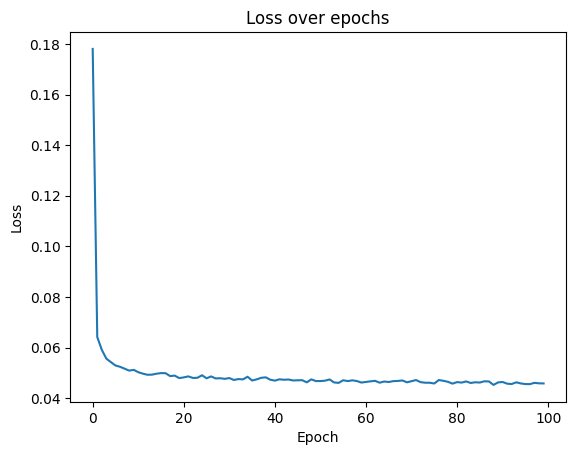

In [19]:
# plot the loss
if not no_train:
    plt.plot(np.arange(n_epochs), losses)
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Loss over epochs")
    plt.show()

In [23]:
from scipy.linalg import sqrtm

def calculate_fid(images1, images2, device, eps=1e-6):
    # Calculate mean and covariance for fake images
    mu1 = torch.mean(images1, dim=0).to(device)
    sigma1 = torch_cov(images1, mu1).to(device)

    # Calculate mean and covariance for real images
    mu2 = torch.mean(images2, dim=0).to(device)
    sigma2 = torch_cov(images2, mu2).to(device)

    # Calculate the square root of the matrix product of the covariances
    cov_mean = np.sqrt(np.dot(sigma1.cpu().numpy(), sigma2.cpu().numpy()))

    # Check if the covariance matrices are nearly singular
    if np.isnan(cov_mean).any() or np.isinf(cov_mean).any():
        cov_mean = np.diag(np.ones(cov_mean.shape[0]))

    cov_mean = torch.from_numpy(cov_mean).to(device)

    # Calculate the FID score
    fid = torch.norm(mu1 - mu2)**2 + torch.trace(sigma1 + sigma2 - 2*cov_mean)

    return fid.item()


def torch_cov(x, y):
    n_samples = x.size(0)
    x = x.view(n_samples, -1)
    y = y.view(1, -1)
    x = x - torch.mean(x, dim=0, keepdim=True)
    y = y - torch.mean(y, dim=1, keepdim=True)
    cov = x.t() @ y / (n_samples - 1)
    return cov

# Generating new images
generated = generate_new_images(best_model, n_samples=1, device=device)

# get the first generated image
generated_img = torch.from_numpy(generated[0].cpu().detach().numpy()).to(device)

# get the first real image from cifar10
real_img = torch.from_numpy(next(iter(loader))[0][0].cpu().detach().numpy()).to(device)

# calculate the FID score
fid = calculate_fid(generated_img, real_img, device=device)

print(f'FID Score: {fid}')

FID Score: 177.7147216796875


Generating new images


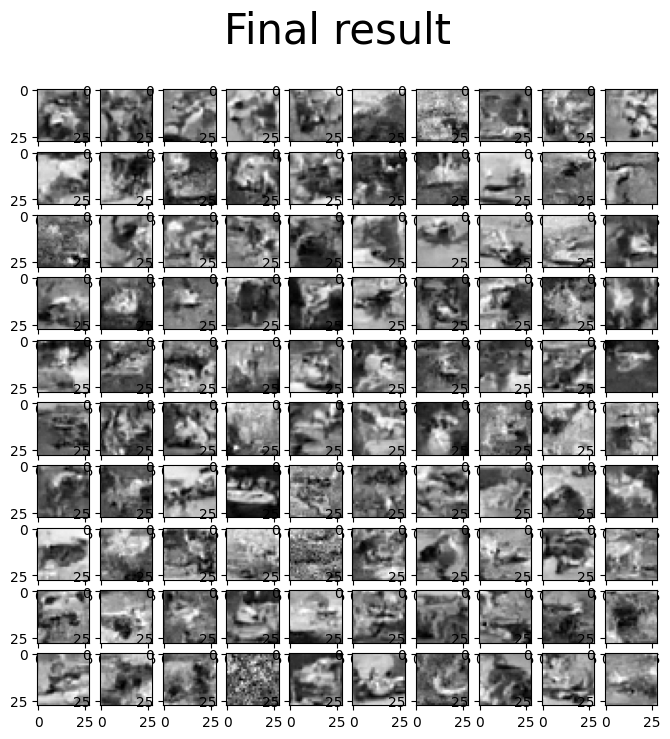

In [24]:
print("Generating new images")
generated = generate_new_images(
        best_model,
        n_samples=100,
        device=device,
        gif_name="cifar.gif"
    )
show_images(generated, "Final result")

# Visualizing the diffusion

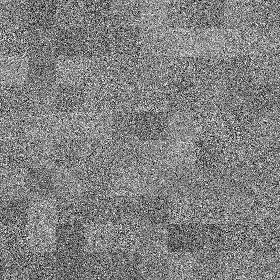

In [25]:
from IPython.display import Image
with open('cifar.gif', 'rb') as f:
    content = f.read()
Image(content)


# Conclusion

In this notebook, we implemented a DDPM PyTorch module from scratch. We used a custom UNet-like architecture and the nice sinusoidal positional-embedding technique to condition the denoising process of the network on the particular time-step. We trained the model on the CIFAR10 dataset and in only 20 epochs we were able to generate new samples for these toy datasets.